In [3]:
import requests
import time
import csv
import os
api_key = "RGAPI-2312c39a-2baf-40c1-afa0-bb2a806c3635"
api_key

'RGAPI-2312c39a-2baf-40c1-afa0-bb2a806c3635'

In [5]:
api_url = "https://europe.api.riotgames.com/lol/match/v5/matches/by-puuid/-bxOGf0595DSA8xk31K2W7uGP2xd1HVj3XlrYoDirw2TW2iBVMdEvKBXbAX8aQcVAvvg8J-ZCiQtiQ/ids?start=0&count=12&api_key=RGAPI-2312c39a-2baf-40c1-afa0-bb2a806c3635"
resp = requests.get(api_url)
resp

<Response [200]>

In [7]:
games = resp.json()
games

['EUW1_7534703028',
 'EUW1_7533968869',
 'EUW1_7533523868',
 'EUW1_7533456724',
 'EUW1_7532349435',
 'EUW1_7532295325',
 'EUW1_7532249284',
 'EUW1_7532064446',
 'EUW1_7531988338',
 'EUW1_7531674402',
 'EUW1_7531622047',
 'EUW1_7531568841']

In [9]:
games[11]

'EUW1_7531568841'

In [11]:
game_id = 'EUW1_7533968869'
game_api_url = ("https://europe.api.riotgames.com/lol/match/v5/matches/"
    + game_id+ "?api_key=RGAPI-2312c39a-2baf-40c1-afa0-bb2a806c3635")
game_api_url

'https://europe.api.riotgames.com/lol/match/v5/matches/EUW1_7533968869?api_key=RGAPI-2312c39a-2baf-40c1-afa0-bb2a806c3635'

In [13]:
resp = requests.get(game_api_url)
resp

<Response [200]>

In [15]:
all_puuids = [] 
for game_id in games:
    game_api_url = ("https://europe.api.riotgames.com/lol/match/v5/matches/"
    + game_id+ "?api_key=RGAPI-2312c39a-2baf-40c1-afa0-bb2a806c3635")
    resp = requests.get(game_api_url)
    game = resp.json()
    puuids = [participant['puuid'] for participant in game['info']['participants']]
    all_puuids.extend(puuids) 

print(all_puuids)

['gIbWJJvSgtd8hp0AVxXx5Kx8Cu2BR1X33bq90DKnkRF3JhMe7iCG-p4Oz1BMW7THKa0QJIX0lZUBjA', 'bJmAYNeVI52yJfI-VcUcGxrSk_lH5J07861_1xEtQat1J7tx-Vsytr2dVAD9LUldk8majCLxVQIXzw', 'GrX06dPBY-MaHUZdLPmrx3pt2vm2MukBJvGcMnQKnTpW1WiboGKn5zMl9f2YKVRaAjipEJNAMW0OlQ', 'sv7IBoX_WG56yHWp6AJAmWaP5qz19taMtsa5PQMS_bt9QQDr5TKxRTPiJdd8OpgQfZTlICgRlCKKog', '2daj5tH353Fg1m5oCf7VAo1jRnDKwTkG1ZwSPXiXS6UVB-CqNGFP_ZJf9GG0QgR8B7iOrzJwyrwNlw', 'w8SAlR5ILkiH0dypoWDSXtULHZX14hmltoLF2Mzkp5U3_oescphrLmH0yxUf1-fW7eeJLX41O7Y1Kg', '-bxOGf0595DSA8xk31K2W7uGP2xd1HVj3XlrYoDirw2TW2iBVMdEvKBXbAX8aQcVAvvg8J-ZCiQtiQ', 'Lury6lT14lz_EZE0GaTAbhdmF28QgHa1IgLx_4sC-gBs9wDrSyFPlqxt4hF-EEIGROOuAmFlPDAdnQ', 'e-VFbnOacV4wh4ZtXAFecm1fZrTIKpOJsDs4NUamPibTzLqeUyWomZEUE2ClhUFKK6VqophvTKEnWg', 'cyngodtpAZ6N1Csr7f6RUFQpmFfNDeCUXFSjNJY0MnV0daU9D-dt4W5gXy6CTfpyX1d_uP0S4KuOSQ', 'HU5eCORWPb_4KLytZ_Tgv7BTmfnWF9hDM64MenoiCmhrJ44EFvSHthjqY1DW6jY8pQ-AsFY0xifO8w', 'v99kQPhpHvf2rfdBNSxBBzyapgvhh4Ya1xdHRzxSxDOhVyWFGHgb6z-zksaHNKFnt7dkCn5kGxFgOQ', 'BfJ7D87VZ7ZGFs

In [25]:
len(all_puuids)

114

In [27]:
all_puuids = list(set(all_puuids))
all_puuids

['xUrjY8yQu5stPjUKy7TI8j7ZG1yKJf22MsQboIlzccYIXTSflwaoNdmDawUKXnNvVe1hLjhf2G3yxw',
 'ii1yfeww56uAOe-zlVCzVQudrmapWeHrEBpZGqLiKhdfq6_kpJsD6fPLK2N0OD5IukHBjadmQ87zkA',
 'S-AdFR5aOywsgKAgt6hCqtcDu2nwvsEGWji55CQuCWdq4AuPVOZmOnMBzxdr0-AjJyM2agZPKMF9yw',
 'Tz-67uk37Dv573p17tZtryLJe2TTNp1ZF6AMOpknWJ6Eouo9CWL8WbO6Prw1G31-db5Di2Bk105rSg',
 'b7lfW9_7FKer2knoJltGZkV4D0-lgtUYC_7FEuqfF9d3pKVahUqes6M_mnnUvQOeA7Gi0zKuaOtS6Q',
 'NFp8Y2qqIIbHDh-mCKj3lrUp0wJnsFBRDn1p3MNwOvvq5qMhgL5zoMCn1lmwdWOHh46cnFsH8zvc7g',
 'lNd32BmVmp81KBdD5p46SliMKdUl0OnYW--z81x6PSmZ2rStTcLGLezlf_VhpE64EuZNCxyh94CsaQ',
 'PVsMJXcgccmlNrOXKwlc6zRqKtpFCJ4Pfxtux3smBEahICx39O7pENuPbvHoiYQIemZWU_GBj24W1w',
 '2daj5tH353Fg1m5oCf7VAo1jRnDKwTkG1ZwSPXiXS6UVB-CqNGFP_ZJf9GG0QgR8B7iOrzJwyrwNlw',
 'zBC0MQmB3ufqLUeZnlnQKOUlsn3f1r0x_orFCyeY5MnUnUMJpPOc6QA3MFYzNn2A2WAdpB2pZ4BO2g',
 'v99kQPhpHvf2rfdBNSxBBzyapgvhh4Ya1xdHRzxSxDOhVyWFGHgb6z-zksaHNKFnt7dkCn5kGxFgOQ',
 'Io1FM3qN_YnqQ1UBs7Vzal1j3CP_4_MQMswatRbZbPLHQa41ILZrCdgpjrPm4pWba8xOPiyrpa5joQ',
 'vD

In [29]:
len(all_puuids)

114

In [ ]:
import riotwatcher
from riotwatcher import LolWatcher, ApiError

# Initialize the Watcher
api_key = "RGAPI-2312c39a-2baf-40c1-afa0-bb2a806c3635"
watcher = LolWatcher(api_key)
my_region = 'euw1'

def get_10_min_features(match_id, target_puuid):
    # Fetch the data
    try:
        match_data = watcher.match.by_id(my_region, match_id)
        timeline_data = watcher.match.timeline_by_match(my_region, match_id)
    except ApiError as err:
        print(f"API Error: {err}")
        return None

    # 1.Find the player's team and participant info
    target_team_id = None
    target_participant_id = None
    team_participant_ids = []
    enemy_team_id = None

    for participant in match_data['info']['participants']:
        pid = participant['participantId']
        if participant['puuid'] == target_puuid:
            target_team_id = participant['teamId']
            target_participant_id = pid
        participant['pid'] = pid

    for participant in match_data['info']['participants']:
        if participant['teamId'] == target_team_id:
            team_participant_ids.append(participant['pid'])
        else:
            enemy_team_id = participant['teamId']

    if None in (target_team_id, target_participant_id, enemy_team_id):
        print("Error: Could not find player or determine teams.")
        return None

    # 2. Intialize feature containers
    features = {
        'match_id': match_id,
        'target_puuid': target_puuid,
        'team_kdas': {},
        'team_gold': 0,
        'enemy_gold': 0,
        'dragon': 0,
        'voidgrubs': 0,
        'win': None
    }

    for pid in team_participant_ids:
        features['team_kdas'][f"player_{pid}_kills"] = 0
        features['team_kdas'][f"player_{pid}_deaths"] = 0
        features['team_kdas'][f"player_{pid}_assists"] = 0

    # 3. Process timeline events up to 10 minutes
    ten_min_frame = None  # This will hold the frame closest to 10:00

    for frame in timeline_data['info']['frames']:
        if frame['timestamp'] > 600000:
            break
        # This is the newest valid frame we've seen so far
        ten_min_frame = frame

        # Process events: KDA, Objectives
        for event in frame['events']:
            # Process KDA Events
            if event['type'] == 'CHAMPION_KILL':
                killer_id = event.get('killerId')
                victim_id = event.get('victimId')
                assisting_ids = event.get('assistingParticipantIds', [])

                if killer_id in team_participant_ids:
                    features['team_kdas'][f"player_{killer_id}_kills"] += 1
                if victim_id in team_participant_ids:
                    features['team_kdas'][f"player_{victim_id}_deaths"] += 1
                for assister_id in assisting_ids:
                    if assister_id in team_participant_ids:
                        features['team_kdas'][f"player_{assister_id}_assists"] += 1

            # Process Objective Events
            if event['type'] == 'ELITE_MONSTER_KILL':
                killer_team_id = event.get('killerTeamId')
                monster_type = event.get('monsterType')
                monster_sub_type = event.get('monsterSubType', '').upper()

                if monster_type == 'DRAGON':
                    if killer_team_id == target_team_id:
                        features['dragon'] = 1
                    elif killer_team_id == enemy_team_id:
                        features['dragon'] = 2

                if monster_type == 'HORDE' and 'VOIDGRUB' in monster_sub_type:
                    if killer_team_id == target_team_id:
                        features['voidgrubs'] = 1
                    elif killer_team_id == enemy_team_id:
                        features['voidgrubs'] = 2

    # 4. Process gold from the frame closest to 10 minutes
    if ten_min_frame is not None:
        for participant_frame in ten_min_frame['participantFrames'].values():
            pid = participant_frame['participantId']
            gold = participant_frame['totalGold']
            if pid in team_participant_ids:
                features['team_gold'] += gold
            else:
                features['enemy_gold'] += gold
    else:
        print("Warning: No frame found before 10 minutes.")

    # 5. Get the target variable(win or lose)
    for participant in match_data['info']['participants']:
        if participant['puuid'] == target_puuid:
            features['win'] = participant['win']
            break

    return features

In [ ]:
# Create or open CSV file for writing
csv_file = 'D:/dataScienceProject/League_of_Legends_data.csv'
file_exists = os.path.isfile(csv_file)

for puuid in all_puuids:
    games_api_url = ("https://europe.api.riotgames.com/lol/match/v5/matches/by-puuid/"
    +puuid+
    "/ids?start=0&count=100&api_key=RGAPI-2312c39a-2baf-40c1-afa0-bb2a806c3635")
    
    games = resp.json()
    
    while True:
        resp = requests.get(games_api_url)
        
        if resp.status_code == 429:
            print("Rate limited. Sleeping for 10 seconds...")
            time.sleep(10)
            continue  # Retry the request
        
        elif resp.status_code == 200:
            games = resp.json()
            break  # Exit the while loop and process games
        
        else:
            print(f"Error: {resp.status_code}")
            break  # Exit on other errors
    
    # Open CSV file in append mode for each PUUID
    with open(csv_file, 'a', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        
        # Write header if file doesn't exist
        if not file_exists:
            # Create header row
            headers = ['match_id', 'puuid', 'team_gold', 'enemy_gold', 'dragon', 'voidgrubs', 'win']
            # Add KDA headers
            for i in range(1, 11):
                headers.extend([f'player_{i}_kills', f'player_{i}_deaths', f'player_{i}_assists'])
            
            writer.writerow(headers)
            file_exists = True
        
        # Process each game
        for game_id in games:
            result = get_10_min_features(game_id, puuid)
            if result:
                print(f"Match ID: {result['match_id']}")
                print(f"Player's Team Gold: {result['team_gold']}")
                print(f"Enemy Team Gold: {result['enemy_gold']}")
                print(f"Dragon Taken By: {result['dragon']} (0=None, 1=Player's Team, 2=Enemy)")
                print(f"Voidgrubs Taken By: {result['voidgrubs']} (0=None, 1=Player's Team, 2=Enemy)")
                print("\nTeam KDA Breakdown:")
                for stat, value in result['team_kdas'].items():
                    print(f"  {stat}: {value}")
                print(f"\nTarget Variable (Did player's team win?): {result['win']}")
                
                # Prepare data for CSV
                row_data = [
                    result['match_id'],
                    puuid,
                    result['team_gold'],
                    result['enemy_gold'],
                    result['dragon'],
                    result['voidgrubs'],
                    result['win']
                ]
                
                # Add KDA data in order (player_1 to player_10)
                for i in range(1, 11):
                    row_data.extend([
                        result['team_kdas'].get(f'player_{i}_kills', 0),
                        result['team_kdas'].get(f'player_{i}_deaths', 0),
                        result['team_kdas'].get(f'player_{i}_assists', 0)
                    ])
                
                # Write to CSV
                writer.writerow(row_data)
                print(f"Saved data for match {result['match_id']} to CSV")
                
            else:
                print("Failed to extract features.")

Match ID: EUW1_7532655029
Player's Team Gold: 15119
Enemy Team Gold: 15056
Dragon Taken By: 2 (0=None, 1=Player's Team, 2=Enemy)
Voidgrubs Taken By: 0 (0=None, 1=Player's Team, 2=Enemy)

Team KDA Breakdown:
  player_1_kills: 3
  player_1_deaths: 3
  player_1_assists: 0
  player_2_kills: 0
  player_2_deaths: 2
  player_2_assists: 1
  player_3_kills: 0
  player_3_deaths: 0
  player_3_assists: 1
  player_4_kills: 1
  player_4_deaths: 0
  player_4_assists: 2
  player_5_kills: 2
  player_5_deaths: 0
  player_5_assists: 1

Target Variable (Did player's team win?): False
Saved data for match EUW1_7532655029 to CSV
Match ID: EUW1_7532614221
Player's Team Gold: 15786
Enemy Team Gold: 15086
Dragon Taken By: 1 (0=None, 1=Player's Team, 2=Enemy)
Voidgrubs Taken By: 0 (0=None, 1=Player's Team, 2=Enemy)

Team KDA Breakdown:
  player_1_kills: 0
  player_1_deaths: 0
  player_1_assists: 0
  player_2_kills: 1
  player_2_deaths: 2
  player_2_assists: 0
  player_3_kills: 1
  player_3_deaths: 2
  player_3_

KeyboardInterrupt: 

In [103]:
len(all_games)

9960

In [105]:
all_games = list(set(all_games))
len(all_games)

9571

In [35]:
import pandas as pd

# Load the data
df = pd.read_csv('D:/dataScienceProject/League_of_Legends_data.csv')

# Check for duplicate match_id values
duplicate_match_ids = df[df.duplicated('match_id', keep=False)]

if duplicate_match_ids.empty:
    print("No duplicate games found.")
else:
    print(f"Found {len(duplicate_match_ids)} duplicate match_id entries:")
    print(duplicate_match_ids[['match_id']].value_counts())

Found 573 duplicate match_id entries:
match_id       
EUW1_7532064446    15
EUW1_7534703028    10
EUW1_7532349435    10
EUW1_7533456724    10
EUW1_7533523868    10
                   ..
EUW1_7522702685     2
EUW1_7523353676     2
EUW1_7524139682     2
EUW1_7524154692     2
EUW1_7527712405     2
Name: count, Length: 235, dtype: int64


In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Set style for visualizations
plt.style.use('default')
sns.set_palette("colorblind")
df = pd.read_csv('D:/dataScienceProject/League_of_Legends_data.csv')

print("Dataset Shape:", df.shape)
print("\nColumn Names:")
print(df.columns.tolist())
print("\nData Types:")
print(df.dtypes)
print("\nMissing Values:")
print(df.isnull().sum())
print("\nBasic Statistics:")
print(df.describe())

Dataset Shape: (10861, 37)

Column Names:
['match_id', 'puuid', 'team_gold', 'enemy_gold', 'dragon', 'voidgrubs', 'win', 'player_1_kills', 'player_1_deaths', 'player_1_assists', 'player_2_kills', 'player_2_deaths', 'player_2_assists', 'player_3_kills', 'player_3_deaths', 'player_3_assists', 'player_4_kills', 'player_4_deaths', 'player_4_assists', 'player_5_kills', 'player_5_deaths', 'player_5_assists', 'player_6_kills', 'player_6_deaths', 'player_6_assists', 'player_7_kills', 'player_7_deaths', 'player_7_assists', 'player_8_kills', 'player_8_deaths', 'player_8_assists', 'player_9_kills', 'player_9_deaths', 'player_9_assists', 'player_10_kills', 'player_10_deaths', 'player_10_assists']

Data Types:
match_id             object
puuid                object
team_gold             int64
enemy_gold            int64
dragon                int64
voidgrubs             int64
win                    bool
player_1_kills        int64
player_1_deaths       int64
player_1_assists      int64
player_2_kill

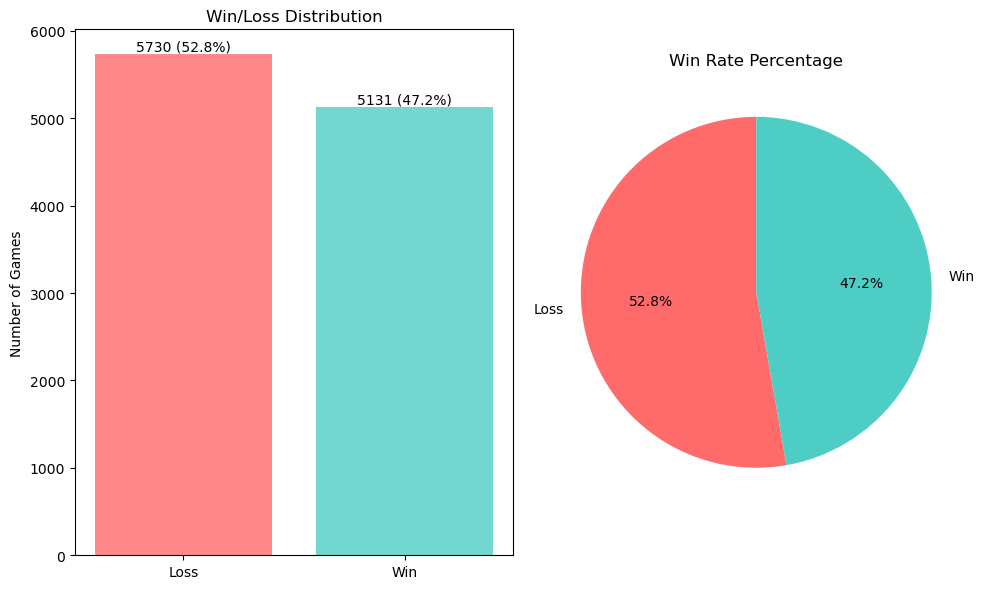

In [39]:
# Win/Loss distribution
plt.figure(figsize=(10, 6))
win_counts = df['win'].value_counts()
colors = ['#FF6B6B', '#4ECDC4']  # Red for False (Loss), Teal for True (Win)

plt.subplot(1, 2, 1)
bars = plt.bar(['Loss', 'Win'], win_counts.values, color=colors, alpha=0.8)
plt.title('Win/Loss Distribution')
plt.ylabel('Number of Games')
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 5,
             f'{height} ({height/len(df)*100:.1f}%)',
             ha='center', va='bottom')

plt.subplot(1, 2, 2)
plt.pie(win_counts.values, labels=['Loss', 'Win'], autopct='%1.1f%%', 
        colors=colors, startangle=90)
plt.title('Win Rate Percentage')

plt.tight_layout()
plt.show()

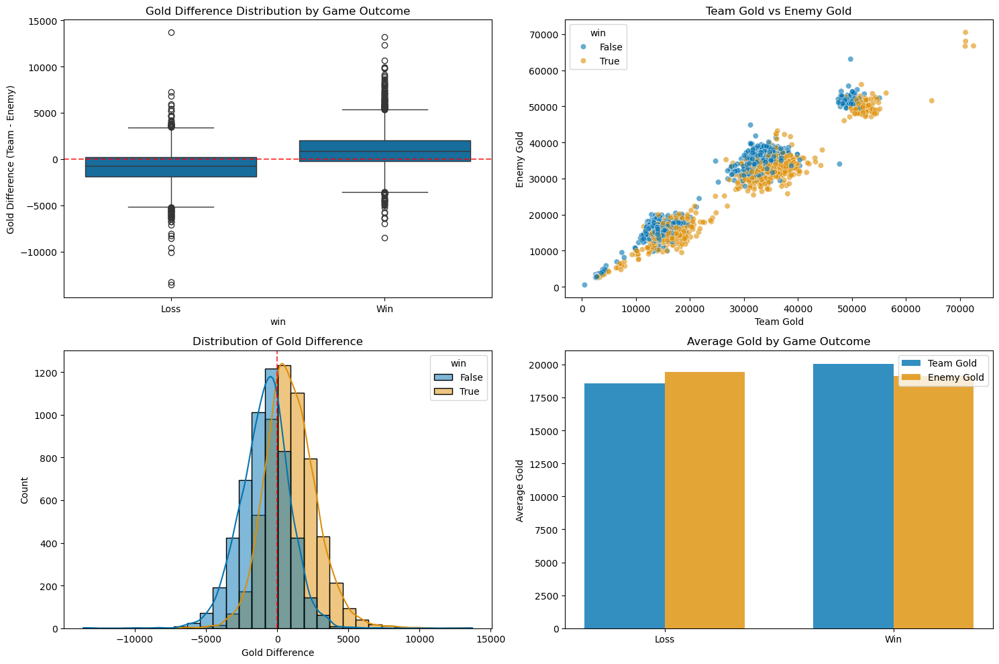

T-test for Gold Difference: t-statistic = -52.87, p-value = 0.0000e+00


In [41]:
# Create gold difference feature
df['gold_diff'] = df['team_gold'] - df['enemy_gold']

plt.figure(figsize=(15, 10))

# Gold distribution by win/loss
plt.subplot(2, 2, 1)
sns.boxplot(x='win', y='gold_diff', data=df)
plt.title('Gold Difference Distribution by Game Outcome')
plt.xticks([0, 1], ['Loss', 'Win'])
plt.ylabel('Gold Difference (Team - Enemy)')
plt.axhline(y=0, color='red', linestyle='--', alpha=0.7)

# Team gold vs Enemy gold correlation
plt.subplot(2, 2, 2)
sns.scatterplot(x='team_gold', y='enemy_gold', hue='win', data=df, alpha=0.6)
plt.title('Team Gold vs Enemy Gold')
plt.xlabel('Team Gold')
plt.ylabel('Enemy Gold')

# Gold difference histogram
plt.subplot(2, 2, 3)
sns.histplot(data=df, x='gold_diff', hue='win', kde=True, bins=30)
plt.title('Distribution of Gold Difference')
plt.xlabel('Gold Difference')
plt.axvline(x=0, color='red', linestyle='--', alpha=0.7)

# Average gold by outcome
plt.subplot(2, 2, 4)
avg_gold = df.groupby('win')[['team_gold', 'enemy_gold']].mean()
x = np.arange(2)
width = 0.35
bars1 = plt.bar(x - width/2, avg_gold['team_gold'], width, label='Team Gold', alpha=0.8)
bars2 = plt.bar(x + width/2, avg_gold['enemy_gold'], width, label='Enemy Gold', alpha=0.8)
plt.title('Average Gold by Game Outcome')
plt.xticks(x, ['Loss', 'Win'])
plt.ylabel('Average Gold')
plt.legend()

plt.tight_layout()
plt.show()

# Statistical test for gold difference
loss_gold = df[df['win'] == False]['gold_diff']
win_gold = df[df['win'] == True]['gold_diff']
t_stat, p_value = stats.ttest_ind(loss_gold, win_gold)
print(f"T-test for Gold Difference: t-statistic = {t_stat:.2f}, p-value = {p_value:.4e}")

In [55]:
# Check if voidgrubs column exists and contains only zeros
if 'voidgrubs' in df.columns:
    print(f"Voidgrubs column unique values: {df['voidgrubs'].unique()}")
    print(f"Voidgrubs value counts:\n{df['voidgrubs'].value_counts()}")
    
    # Remove the voidgrubs column
    df = df.drop('voidgrubs', axis=1)
    
    # Save the cleaned dataframe to a new CSV file
    df.to_csv('D:/dataScienceProject/League_of_Legends_data.csv', index=False)
    print("Voidgrubs column removed and cleaned data saved to 'League_of_Legends_data_cleaned.csv'")
else:
    print("Voidgrubs column not found in the dataset")

# Display the new column structure
print("\nUpdated column names:")
print(df.columns.tolist())
print(f"\nNew shape: {df.shape}")

Voidgrubs column unique values: [0]
Voidgrubs value counts:
voidgrubs
0    10861
Name: count, dtype: int64
Voidgrubs column removed and cleaned data saved to 'League_of_Legends_data_cleaned.csv'

Updated column names:
['match_id', 'puuid', 'team_gold', 'enemy_gold', 'dragon', 'win', 'player_1_kills', 'player_1_deaths', 'player_1_assists', 'player_2_kills', 'player_2_deaths', 'player_2_assists', 'player_3_kills', 'player_3_deaths', 'player_3_assists', 'player_4_kills', 'player_4_deaths', 'player_4_assists', 'player_5_kills', 'player_5_deaths', 'player_5_assists', 'player_6_kills', 'player_6_deaths', 'player_6_assists', 'player_7_kills', 'player_7_deaths', 'player_7_assists', 'player_8_kills', 'player_8_deaths', 'player_8_assists', 'player_9_kills', 'player_9_deaths', 'player_9_assists', 'player_10_kills', 'player_10_deaths', 'player_10_assists', 'gold_diff', 'total_kills', 'total_deaths', 'total_assists', 'kda_ratio', 'gold_per_kill']

New shape: (10861, 42)


In [ ]:
# Create gold difference feature
df['gold_diff'] = df['team_gold'] - df['enemy_gold']

# Define team assignments
blue_players = range(1, 6)    # Players 1-5: Blue team
red_players = range(6, 11)    # Players 6-10: Red team

# Create BLUE team features only
blue_kills = [f'player_{i}_kills' for i in blue_players]
blue_deaths = [f'player_{i}_deaths' for i in blue_players]
blue_assists = [f'player_{i}_assists' for i in blue_players]

df['blue_total_kills'] = df[blue_kills].sum(axis=1)
df['blue_total_deaths'] = df[blue_deaths].sum(axis=1)
df['blue_total_assists'] = df[blue_assists].sum(axis=1)
df['blue_kda'] = (df['blue_total_kills'] + df['blue_total_assists']) / df['blue_total_deaths'].replace(0, 1)

# Create relative performance features (Blue vs Red)
# Instead of red stats, create difference metrics
red_kills = [f'player_{i}_kills' for i in red_players]
red_deaths = [f'player_{i}_deaths' for i in red_players]
red_assists = [f'player_{i}_assists' for i in red_players]

df['kill_diff'] = df[blue_kills].sum(axis=1) - df[red_kills].sum(axis=1)
df['death_diff'] = df[blue_deaths].sum(axis=1) - df[red_deaths].sum(axis=1)
df['assist_diff'] = df[blue_assists].sum(axis=1) - df[red_assists].sum(axis=1)

# Calculate red KDA only for the difference, then we'll drop it
red_total_kills = df[red_kills].sum(axis=1)
red_total_deaths = df[red_deaths].sum(axis=1)
red_total_assists = df[red_assists].sum(axis=1)
red_kda = (red_total_kills + red_total_assists) / red_total_deaths.replace(0, 1)

df['kda_diff'] = df['blue_kda'] - red_kda

# Create X and y
team_features = [
    'team_gold', 'enemy_gold', 'gold_diff', 'dragon', 
    'blue_total_kills', 'blue_total_deaths', 'blue_total_assists', 'blue_kda', 
    'kill_diff', 'death_diff', 'assist_diff', 'kda_diff' 
]

In [63]:
X = df[team_features]
y = df['win']

In [67]:
print("Shape of X (features):", X.shape)
print("Shape of y (target):", y.shape)
print("\nFeature columns:")
print(X.columns.tolist())
print(f"\nTarget variable value counts:\n{y.value_counts()}")

Shape of X (features): (10861, 12)
Shape of y (target): (10861,)

Feature columns:
['team_gold', 'enemy_gold', 'gold_diff', 'dragon', 'blue_total_kills', 'blue_total_deaths', 'blue_total_assists', 'blue_kda', 'kill_diff', 'death_diff', 'assist_diff', 'kda_diff']

Target variable value counts:
win
True     5730
False    5131
Name: count, dtype: int64


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Use Classifier
model = GradientBoostingClassifier(
    n_estimators=450,
    random_state=42,
    learning_rate=0.1
)
model.fit(X_train, y_train)

# Check what the model sees
print("Target variable type:", type(y_train.iloc[0]))
print("Unique values in y_train:", y_train.unique())

Target variable type: <class 'numpy.bool_'>
Unique values in y_train: [ True False]


In [133]:
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]  # Probability of True class

print("Predictions:", y_pred)
print("Prediction probabilities:", y_pred_proba[:10])  # First 10 probabilities

Predictions: [False  True False ... False  True False]
Prediction probabilities: [0.38527566 0.50988908 0.21978155 0.77751764 0.16056062 0.30289649
 0.41657809 0.4629878  0.90907059 0.98073624]


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)

print(f"Accuracy: {accuracy:.3f}")
print(f"ROC AUC: {roc_auc:.3f}")

Accuracy: 0.703
ROC AUC: 0.780
